In [1]:
import os
# Parameters
root_dir = os.getcwd() #"C:\\Users\\Administrator\\Desktop\\probmod-tools\\risk"
wse_file = "WSE_Brentwood_P01_MB.csv"
weights_path = "Brentwood_P01_weights.csv"
curve_groups = {"singFam_1Story_NoBasement": [105, 129, 132, 139, 173], "singFam_2Story_NoBasement": [107, 130, 136, 140, 174], "singFam_3Story_NoBasement": [109], "singFam_1Story_Basement": [106, 121, 133, 181, 704], "singFam_2Story_Basement": [108, 122, 137], "singFam_3Story_Basement": [110, 123], "mobileHome": [189, 191, 192, 203]}
structure_cols = {"Unique Building ID": "plus_code", "Damage Code": "damage_code", "Building Limit": "bldg_limit", "Building Deduction": "bldg_ded", "Content Limit": "cnt_limit", "Content Deduction": "cnt_ded", "Ground Elevation": "GroundElev", "First Floor Height": "first_floor_elev"}
out_AAL = f"AAL_2020_{wse_file}"
out_loss = f"Losses_2020_{wse_file}"
scen = wse_file.replace('.csv','').replace('WSE_','')


# __AAL Calculator__ 

PYTHON 3.6
  
  
Overview: This notebook was created to document the development of the Atkins FEMA AAL loss spreadsheet into python

Updated: 2019-9-18

by Stephen Duncan: sduncan@dewberry.com <br/>
edited by Seth Lawler: slawler@dewberry.com and Alec Brazeau: abrazeau@dewberry.com

In [2]:
import sys
import pathlib as pl
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

pd.options.display.max_columns = 325
pd.options.display.max_rows = 100
%matplotlib inline

root = pl.Path(root_dir)
sys.path.append(str(root.parent / 'core'))
from risk import *

import papermill as pm

ModuleNotFoundError: No module named 'risk'

In [3]:
output_individual_dir = root / scen
os.makedirs(str(output_individual_dir), exist_ok=True)

# Create Area Depth-Damage Curves

- Based on the Damage Categories provided, damage curves can be aggregated and averaged to develop loss data specific to the study area

In [4]:
defaultHazusDDFn_path = root.parent / 'hazusdepthdmgfns' / 'Building_DDF_Full_LUT_Hazus3p0.json'
df_BDDFn = pd.read_json(str(defaultHazusDDFn_path), orient = 'index')
df_BDDFn = hazusID_to_depth(df_BDDFn)

ValueError: Expected object or value

In [5]:
df_agg = aggregate_ddf_curves(df_BDDFn, curve_groups)

NameError: name 'aggregate_ddf_curves' is not defined

### Alter the HAZUS DDf curves to comply with actuaries 

,-4.000000e+00,-3.000000e+00,-2.000000e+00,-1.000000e+00,-1.000000e-12,0.000000e+00,1.000000e+00,2.000000e+00,3.000000e+00,4.000000e+00,...,1.500000e+01,1.600000e+01,1.700000e+01,1.800000e+01,1.900000e+01,2.000000e+01,2.100000e+01,2.200000e+01,2.300000e+01,2.400000e+01
singFam_1Story_NoBasement,0.000000,0.000000,0.0,0.60,0.60,13.40,22.800000,29.60,33.800000,37.800000,...,64.000000,64.80,65.600000,66.0,66.800000,67.20,67.800000,68.400000,69.000000,69.400000
singFam_2Story_NoBasement,0.000000,0.000000,0.0,0.60,0.60,7.80,15.200000,19.00,23.000000,26.000000,...,53.000000,54.00,55.200000,56.4,57.400000,58.40,59.600000,60.400000,61.400000,62.400000
singFam_3Story_NoBasement,0.000000,0.000000,0.0,0.00,0.00,5.00,8.000000,12.00,17.000000,19.000000,...,44.000000,45.00,47.000000,48.0,49.000000,50.00,52.000000,53.000000,54.000000,56.000000
singFam_1Story_Basement,2.200000,2.200000,6.0,9.20,NaN,14.20,18.400000,25.60,30.400000,34.600000,...,66.200000,68.40,70.200000,71.2,72.200000,73.20,75.200000,77.200000,79.000000,80.000000
singFam_2Story_Basement,1.333333,1.333333,5.0,9.00,NaN,13.00,15.666667,21.00,24.666667,29.666667,...,61.666667,63.00,64.666667,66.0,67.666667,69.00,70.666667,72.333333,73.666667,75.333333
singFam_3Story_Basement,1.500000,1.500000,4.5,7.50,NaN,9.50,11.500000,17.50,22.500000,28.500000,...,54.500000,56.00,57.500000,59.0,60.500000,62.00,63.500000,65.000000,66.500000,68.000000
mobileHome,0.250000,0.250000,0.5,0.75,0.75,10.75,33.500000,49.75,65.000000,85.500000,...,92.500000,92.75,93.250000,93.5,93.750000,94.25,94.500000,94.750000,95.000000,95.000000


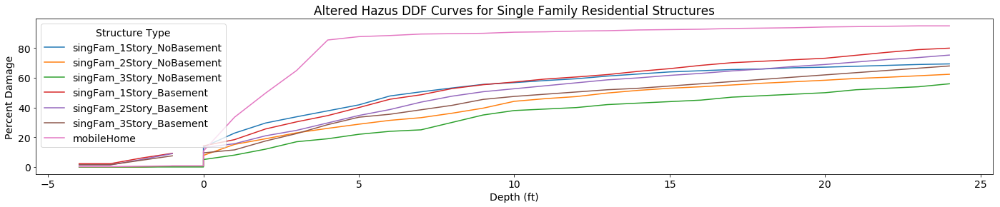

In [5]:
fig, ax = plt.subplots(figsize=(24,4))

# set curve for single family 1 story no basement
df_agg.loc[-1, 'singFam_1Story_NoBasement']= 0.6
df_agg.loc[-0.000000000001, 'singFam_1Story_NoBasement']= 0.6

# set curve for single family 2 story no basement
df_agg.loc[-1, 'singFam_2Story_NoBasement']= 0.6
df_agg.loc[-0.000000000001, 'singFam_2Story_NoBasement']= 0.6

# set curve for single family 3 story no basement
df_agg.loc[-1, 'singFam_3Story_NoBasement']= 0.0
df_agg.loc[-0.000000000001, 'singFam_3Story_NoBasement']= 0.0

# set curve for mobile home
df_agg.loc[-0.000000000001, 'mobileHome']= 0.75

df_agg = df_agg.sort_index()
display(df_agg.T)
ax.plot(df_agg)
ax.legend(labels=df_agg.T.index, title='Structure Type')
ax.set_title('Altered Hazus DDF Curves for Single Family Residential Structures')
ax.set_ylabel('Percent Damage')
ax.set_xlabel('Depth (ft)');

# Weights for modelled runs

In [6]:
try:
    df_weights = pd.read_csv(weights_path, index_col='event_id')
    df_weights.rename(columns={'weight':'RunWeight'}, inplace=True)
except ValueError as e:
    print(e)
    df_weights = pd.read_csv(weights_path)
    df_weights.rename(columns={'Weight':'RunWeight', 'Run':'event_id'}, inplace=True)
    df_weights = df_weights.set_index('event_id')

# Load in the WSE/Attributes csv
### Create a dataframe that maintains the actuarial unique id fields

In [7]:
df_wse_fulldata = pd.read_csv(wse_file, index_col=structure_cols['Unique Building ID'], low_memory=False)
maintain_df = df_wse_fulldata[[x for x in list(structure_cols.values()) if not df_wse_fulldata.index.name in x]]

# Perform Loss Calculations

The following inputs into the `CalcLosses()` are as follows:
- **`df_wse_fulldata`** is a dataframe of the essential structure information with water surface elevations
- **`df_agg`** is the regional damage curves determined by Damage Codes provided in the AAL control file
- **`structure_cols`** are the columns defined in the AAL control file.
- **`Return_DFs`** defines the outputs you want to get out of the function.
    - 'AAl' provides all dataframes calculated by the function. This includes the loss percent, USD losses, depth in structures, and insurance losses. ***This is the Default***
    - 'INSURANCE_DEPTH_AND_PERCENT' includes the loss percent, depth in structures, and insurance losses.
    - 'PERCENT_ONLY' only outputs the loss percent.
    - 'LOSSES_ONLY' only outputs the USD losses.
    - 'INSURANCE_ONLY' only outputs the insurance losses.

In [8]:
Losses_Dict = CalcLosses(df_wse_fulldata, df_agg, structure_cols, 
                         Return_DFs = 'INSURANCE_DEPTH_AND_PERCENT')

CalcLosses Total Time: 3.29 minutes


## Loss Calculation Results

In [9]:
df_depths = Losses_Dict['depths']
df_pctlss = Losses_Dict['loss_pct']
df_DLinsurance = Losses_Dict['loss_insurance']

# Calculate Average Annual Losses (AAL)

`calcAAL_Prob` takes the output losses from the loss calculations and uses the run weight to compute the Average Annual Loss for each building. More can be found on the [Dewberry probmod-tools Wiki on AAL](https://github.com/Dewberry/probmod-tools/wiki/Average-Annual-Losses-(AAL)).

In [10]:
Losses_AAL_Dict = calcAAL_Prob(df_DLinsurance, df_weights, model_weight='RunWeight') 

AAL Methodology Used: "Center"
Probabilistic Preferred
CalcAAL Total Time: 0.01 minutes


In [11]:
df_losses_withaal = Losses_AAL_Dict['losses_with_aal']

In [12]:
df_weights_sort = Losses_AAL_Dict['weights_sorted']

# Save Results

## Save Output AAL to csv

In [13]:
df_AAL_only = pd.DataFrame(df_losses_withaal['AAL'])
df_AAL_only.to_csv(out_AAL)
print(f'### AAL Results saved:\n\n{out_AAL}')

### AAL Results saved:

AAL_Brentwood_P01_MB_2020.csv


## Save all losses to csv

In [14]:
df_losses_withaal.to_csv(out_loss)

## Rejoin to original file to maintain actuarial unique id

In [15]:
final_out_df = pd.merge(maintain_df, df_AAL_only, left_index=True, right_index=True)
final_out_df.to_csv(out_loss.replace('.csv', '_final.csv'))
final_out_df.head()

,damage_code,bldg_limit,bldg_ded,cnt_limit,cnt_ded,GroundElev,first_floor_elev,AAL
plus_code,,,,,,,,
87G8PQ53+XRG2R32,singFam_2Story_Basement,249614,1250,100000,1250,4.96875,4,0.0
87G8PQ63+CHP2H33,singFam_2Story_Basement,138846,1250,54779,1250,8.03125,4,0.0
87G8PQ6G+FMCVV23,singFam_1Story_NoBasement,69255,3000,3389,2000,4.43750,2,0.0
87G8PQ63+JXRWP25,singFam_1Story_NoBasement,247613,2000,59307,2000,3.81250,5,0.0
87G8PQ6G+PMFJQ55,singFam_2Story_Basement,250000,10000,100000,10000,5.21875,4,0.0


# Display Loss Statistics

In [16]:
DisplayStatsForAAL(df_losses_withaal)

# Average AAL: $10.13

# Total AAL: $116,647.88

In [17]:
# min
min_aal_all = df_losses_withaal['AAL'].min()
# max
max_aal_all = df_losses_withaal['AAL'].max()
# median
median_aal_all = df_losses_withaal['AAL'].median()

# Display Other Stat Results
print(f'### Min AAL: {min_aal_all:0.2f}')
print(f'### Max AAL: {max_aal_all:0.2f}')
print(f'### Median AAL: {median_aal_all:0.2f}')

### Min AAL: 0.00
### Max AAL: 23085.90
### Median AAL: 0.00


# Sort damages and depths for each building in ascending order

In [73]:
def sort_data_by_building_id(
    output_dir: pl.Path,
    df_depths: pd.DataFrame,
    df_losses: pd.DataFrame,
    df_rp: pd.DataFrame) -> any:
    """Creates a Damage and Loss index for each buidling with individual Probabilities of Occurance"""
    eventlist = list(sorted(df_rp.index.tolist()))
    zero_aal = []
    aal = []
    for idx in df_losses.index: #idx should be the building id
        if df_losses_withaal.loc[idx,'AAL'] == 0:
            zero_aal.append(idx)
        else:
            aal.append(idx)
            bid = idx
            bldg_limit = df_losses_withaal.loc[bid,'bldg_limit']
            df_indv_depth = pd.DataFrame(df_depths.loc[bid, eventlist])
            df_indv_depth.rename(columns={bid:'depth'}, inplace=True)
            df_indv_depth.fillna(value=0, inplace=True)
            df_bid = pd.DataFrame(df_losses_withaal.loc[bid,eventlist]).sort_values(bid)
            df_bid.rename(columns={bid:'damage'}, inplace=True)
            df_bid['percent_damage'] = df_bid['damage'].apply(lambda x: (x/bldg_limit)*100)
            df_bid['depth'] = df_indv_depth['depth']
            df_bid['RunWeight'] = df_rp['RunWeight']
            for i, idx in enumerate(df_bid.index):
                if i == 0:
                    df_bid.loc[idx, 'ProbEvent'] = df_bid['RunWeight'].sum()
                    previous_tot = df_bid['RunWeight'].sum()
                    previous_weight = df_bid.loc[idx, 'RunWeight']
                else:
                    df_bid.loc[idx, 'ProbEvent'] = previous_tot - previous_weight
                    previous_tot = previous_tot - previous_weight
                    previous_weight = df_bid.loc[idx, 'RunWeight']
            df_bid['event_id'] = df_bid.index
            df_bid.reset_index(drop=True, inplace=True)
            df_bid.to_csv(str(output_dir / f'{bid}.csv'))
    return {'zero_aal': zero_aal, 'aal': aal}

In [74]:
results = sort_data_by_building_id(output_individual_dir, df_depths, df_losses_withaal, df_weights_sort)

In [75]:
for k in results.keys():
    print(k, len(results[k]))

zero_aal 10267
aal 1253


# Print out JPEG plot results

In [111]:
# Formatter Functions
def evt(x, pos) -> str:
    return f'{x*100:0.3f}%'
def pct(x, pos) -> str:
    return '{:0.2f}%'.format((x))
def dollars(x, pos) -> str:
    return '${:,.0f}'.format((x))
def mil(x, pos) -> str:
    return '{:,}'.format(x)

In [137]:
def plot_structure_results(
    bldg_results_csv: pl.Path,
    plottype: str,
    output_dir: pl.Path) -> str:
    """
    :param csv: the building results saved as a csv file
    :param plottype: the type of graph to be made. Valid column names are:
                     "damage", "percent_damage", "depth"
    :param output_dir: where to save the JPEG
    :return: a str path location of the output JPEG
    """
    df = pd.read_csv(str(bldg_results_csv))
    df['calc_aal'] = df['damage'] * df['RunWeight']
    aal = df['calc_aal'].sum()
    fig, ax = plt.subplots(figsize=(20,5))
    ax.semilogx(df['ProbEvent'], df[plottype])
    plt.xlim(0.5,df['ProbEvent'].min())
    ax.grid(which='major', )
    ax.grid(which='minor', color='#4682B4', linestyle='--') #steelblue
    ax.set_xlabel('Probability of Occurence', fontsize=16)
    ax.set_title(f'{bid}: {plottype.title().replace("_"," ")} vs Probability\nAAL: ${aal:0.2f}', fontsize=20)
    evt_formatter = FuncFormatter(evt)
    pct_formatter = FuncFormatter(pct)
    usd_formatter = FuncFormatter(dollars)
    dep_formatter = FuncFormatter(mil)
    for axis in [ax.xaxis]:
        axis.set_major_formatter(evt_formatter)
    for axis in [ax.yaxis]:
        if plottype == 'damage':
            axis.set_major_formatter(usd_formatter)
            ax.set_ylabel(f'Damages ($)', fontsize=16)
        elif plottype == 'percent_damage':
            axis.set_major_formatter(pct_formatter)
            ax.set_ylabel(f'Percent Damages (%)', fontsize=16)
        elif plottype == 'depth':
            axis.set_major_formatter(dep_formatter)
            ax.set_ylabel(f'Depth (ft)', fontsize=16)
    outfile = output_dir / f'{plottype}_{bldg_results_csv.name.replace(".csv",".png")}'
    plt.savefig(str(outfile))
    plt.clf()
    return outfile

C:\Users\sduncan\Anaconda3\envs\BLEtools\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\sduncan\Anaconda3\envs\BLEtools\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\sduncan\Anaconda3\envs\BLEtools\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are re

KeyboardInterrupt: 

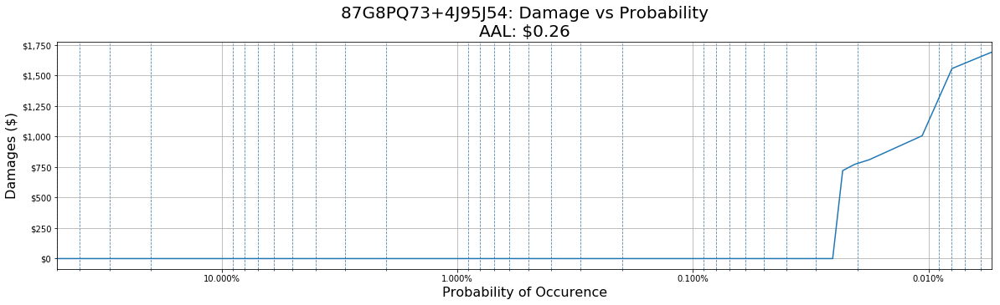

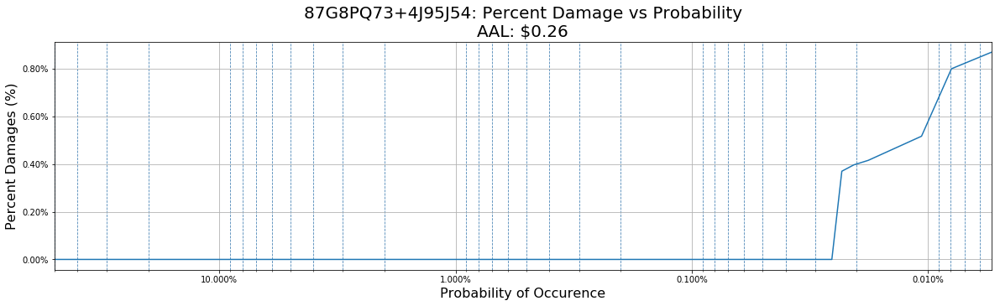

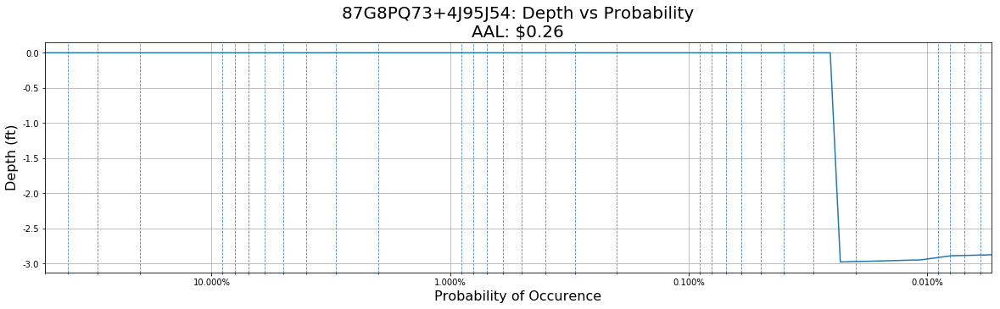

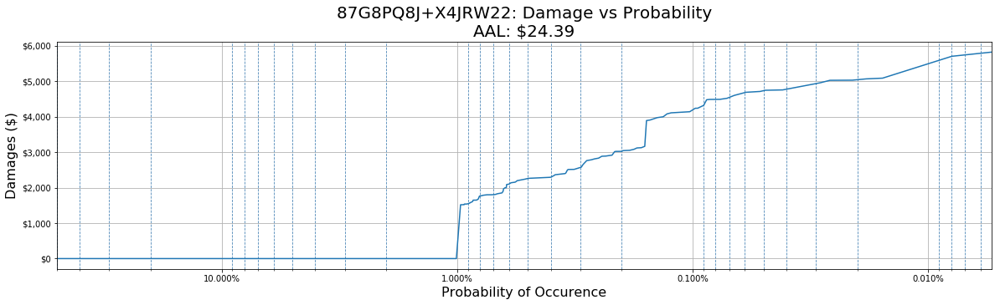

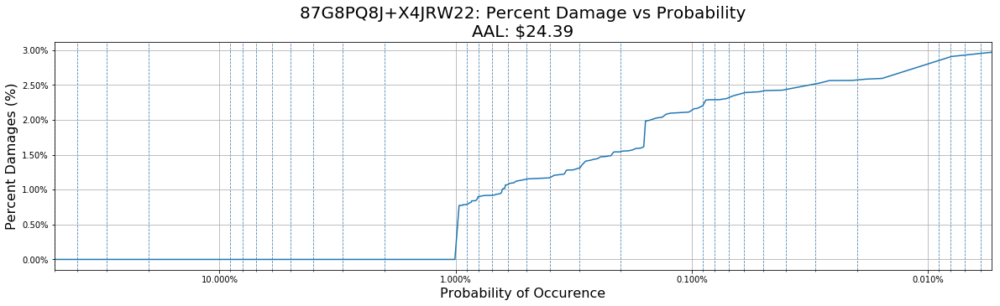

...

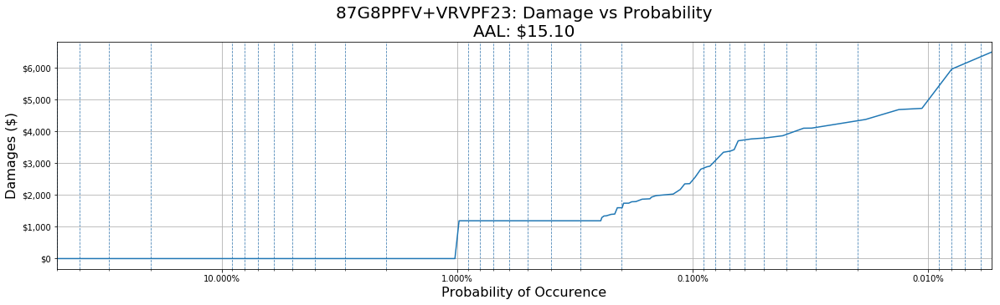

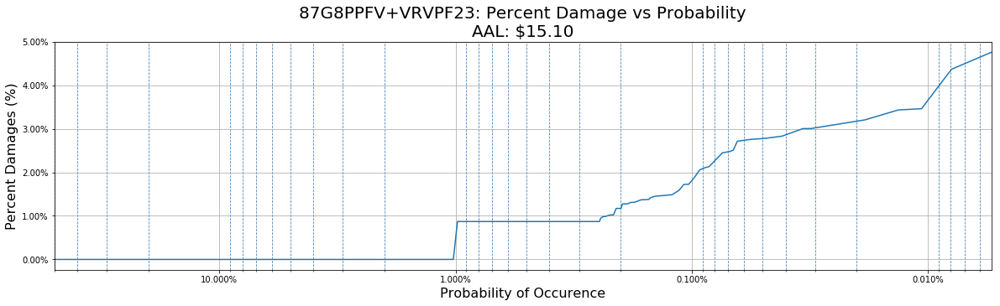

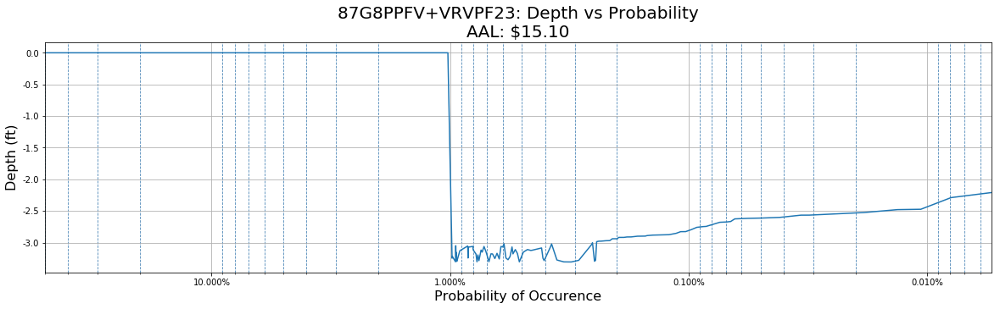

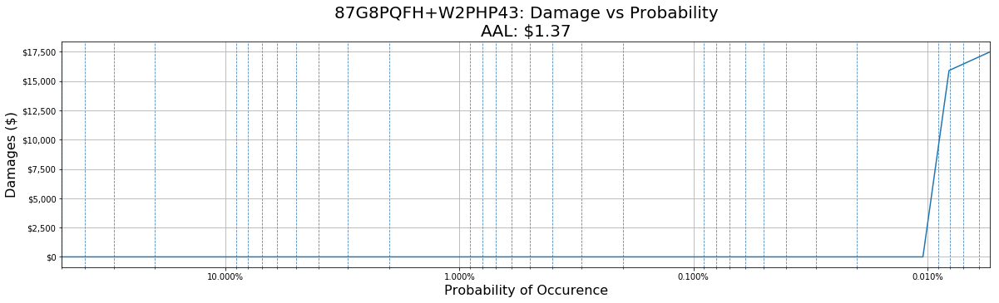

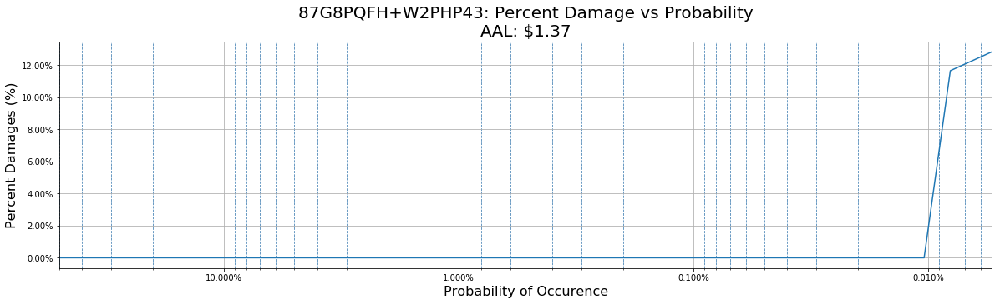

In [ ]:
plottypes = ['damage', 'percent_damage', 'depth']
for bid in results['aal']:
    bldg_results_csv = output_dir / f'{bid}.csv'
    for plottype in plottypes:
        plot_structure_results(bldg_results_csv, plottype, output_individual_dir)

# END SCRIPT